### Plot volume and depth-integrated mixing for the SORRM simulations 

In [12]:
#Packages 
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as tick
import numpy as np
import xarray as xr
import cartopy
import glob
import mosaic
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature
import cmocean.cm as cmo
from matplotlib.colors import LogNorm, SymLogNorm
import cmocean
import matplotlib.path as mpath
import matplotlib.colors as colors
import matplotlib.path as mpath
from matplotlib.ticker import MultipleLocator, FuncFormatter

# import warnings
# warnings.filterwarnings("ignore") #turns off annoying warnings
land_10m = cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                edgecolor='face',
                                facecolor=cfeature.COLORS['land'])
land_110m = cfeature.NaturalEarthFeature('physical', 'land', '110m',
                                edgecolor='face',
                                facecolor=cfeature.COLORS['land'])
crs = ccrs.PlateCarree()


In [3]:
# initial condition file
path = '/global/cfs/cdirs/e3sm/inputdata/ocn/mpas-o/SOwISC12to30E3r3/mpaso.SOwISC12to30E3r3.20240829.nc'
dsm = xr.open_dataset(path)

# Volume integrals 
path = '/global/homes/d/dylan617/repos/CSES_Uyeda_2026/SORRM/mixing_volume_integrated.nc'
dsv = xr.open_dataset(path)

# Sort chronologically
dsv = dsv.sortby("Time")
time = dsv.Time.values

# Months since the first model year
months = np.array([
    (t.year - time[0].year) * 12 + (t.month - 1)
    for t in time
])

### Plot time series of volume integrals

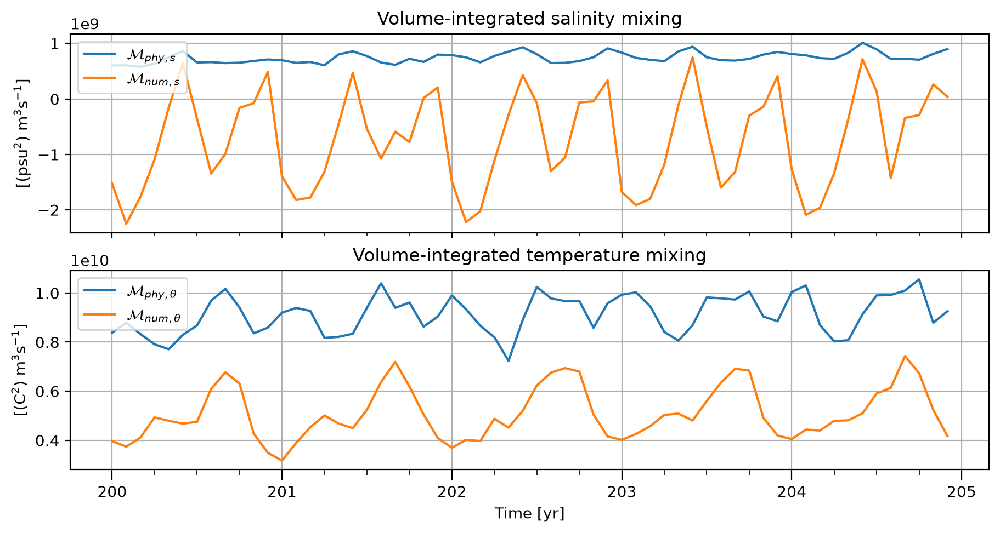

In [4]:
fig, ax = plt.subplots(
    2, 1,
    figsize=(9, 4.75),
    dpi=200,
    constrained_layout=True,
    sharex=True
)

# Salinity
ax[0].plot(
    months,
    dsv.mphy_salt_vint,
    label=r'$\mathcal{M}_{phy,s}$'
)

ax[0].plot(
    months,
    dsv.mnum_salt_vint,
    label=r'$\mathcal{M}_{num,s}$'
)

ax[0].grid()
ax[0].set_title("Volume-integrated salinity mixing")
ax[0].set_ylabel(r'[(psu$^2$) m$^3$s$^{-1}$]')
ax[0].legend(loc='upper left')


# Temperature
ax[1].plot(
    months,
    dsv.mphy_temp_vint,
    label=r'$\mathcal{M}_{phy,\theta}$'
)

ax[1].plot(
    months,
    dsv.mnum_temp_vint,
    label=r'$\mathcal{M}_{num,\theta}$'
)

ax[1].grid()
ax[1].set_title("Volume-integrated temperature mixing")
ax[1].set_ylabel(r'[(C$^2$) m$^3$s$^{-1}$]')
ax[1].set_xlabel("Time [yr]")
ax[1].legend(loc='upper left')

# Major ticks: January of each year
ax[1].xaxis.set_major_locator(MultipleLocator(12))

# Show actual model year: 200, 201, 202, ...
ax[1].xaxis.set_major_formatter(
    FuncFormatter(
        lambda x, pos: str(time[0].year + int(x / 12))
    )
)

# Minor ticks every 3 months: Jan, Apr, Jul, Oct
ax[1].xaxis.set_minor_locator(MultipleLocator(3))

ax[1].tick_params(
    axis="x",
    which="major",
    length=7
)

ax[1].tick_params(
    axis="x",
    which="minor",
    length=4
)

plt.show()

### Depth integrals
Note - sometimes, at least in jupyter, if the figure size / aspect is too off only the colorbar will render. Make it bigger to fix this

In [5]:
path = "/pscratch/sd/d/dylan617/"

dsz_mnum_temp = xr.open_dataarray(
    path + "mnum_temp_vertically_integrated.nc"
)

dsz_mnum_salt = xr.open_dataarray(
    path + "mnum_salt_vertically_integrated.nc"
)

dsz_mphy_temp = xr.open_dataarray(
    path + "mphy_temp_vertically_integrated.nc"
)

dsz_mphy_salt = xr.open_dataarray(
    path + "mphy_salt_vertically_integrated.nc"
)

dsz = xr.Dataset({
    "mnum_temp": dsz_mnum_temp,
    "mnum_salt": dsz_mnum_salt,
    "mphy_temp": dsz_mphy_temp,
    "mphy_salt": dsz_mphy_salt,
}).load()

In [6]:
# define a map projection for our figure
projection = ccrs.Robinson()
# define the transform that describes our dataset
transform = ccrs.PlateCarree()
# create a `Descriptor` object which takes the mesh information and creates
# the polygon coordinate arrays needed for `matplotlib.collections.PolyCollection`.
descriptor = mosaic.Descriptor(dsm, projection, transform)

# Data, done the lazy way. Do a temporal mean
data = [
    dsz.mphy_temp.mean('Time').compute(),
    dsz.mnum_temp.mean('Time').compute()
]
data1 = [
    dsz.mphy_salt.mean('Time').compute(),
    dsz.mnum_salt.mean('Time').compute()
]

### Do a single plot, add coaastlines and land using mosaic + cartopy

In [10]:
mosaic.coastlines?

Signature:
mosaic.coastlines(
    ax: 'GeoAxes',
    descriptor: 'Descriptor',
    color: 'str' = 'black',
    **kwargs,
) -> 'None'
Docstring:
Plot coastal **outlines** using the connectivity info from the MPAS mesh

Parameters
----------
ax : cartopy.mpl.geoaxes.GeoAxes
    The cartopy axes to add the coastlines to.
descriptor : Descriptor
    The descriptor containing the projection and dataset information.
**kwargs
   Additional keyword arguments. See
   :py:class:`matplotlib.collections.Collection` for supported options.
File:      /pscratch/sd/d/dylan617/conda_envs/mosaic_env/lib/python3.12/site-packages/mosaic/coastlines.py
Type:      function

Text(0.5, 1.0, '$\\int \\mathcal{M}_{phy,\\theta}\\,dz$')

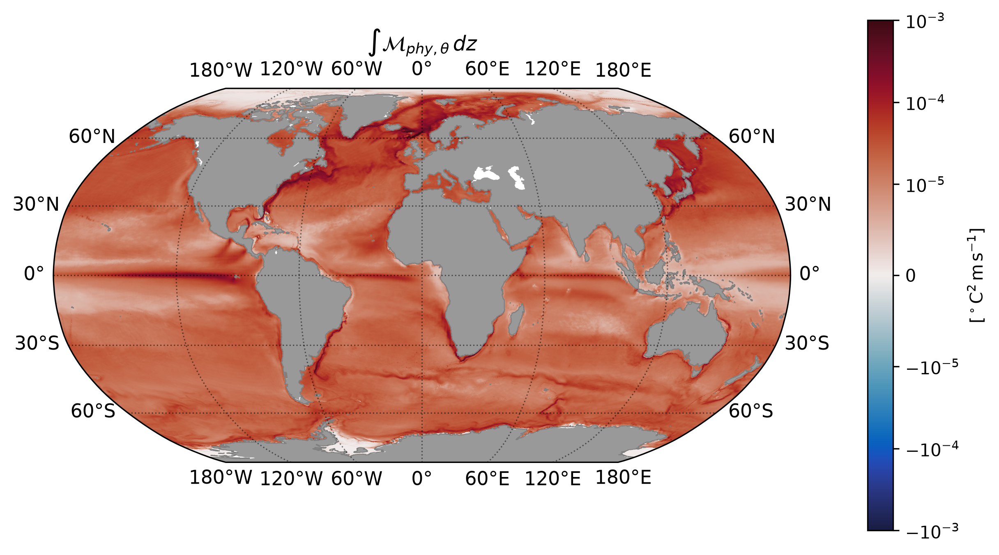

In [11]:
fig, ax = plt.subplots(
    figsize=(8, 6),
    constrained_layout=True,
    subplot_kw={"projection": projection},
    dpi=300
)

norm_temp = colors.SymLogNorm(
    linthresh=1e-5,
    linscale=1,
    vmin=-1e-3,
    vmax=1e-3,
    base=10
)

c = mosaic.polypcolor(
    ax,
    descriptor,
    data[0],
    antialiaseds=False,
    edgecolors="none",
    cmap=cmocean.cm.balance,
    norm=norm_temp
)

fig.colorbar(
    c,
    ax=ax,
    shrink=0.7,
    label=r"[$^\circ\mathrm{C}^2\,\mathrm{m}\,\mathrm{s}^{-1}$]"
)

# Plot the native coastlines with mosaic. We can set the thickness with 
# lw, tune this as needed
mosaic.coastlines(
    ax,
    descriptor,
    color="gray", lw = 0.5
)

# Add land with cartopy, set color to gray
ax.add_feature(
    cfeature.LAND,
    fc="gray",
    zorder=-1,
    alpha=0.8
)

gl = ax.gridlines(
    linewidth=0.75,
    color="black",
    alpha=0.5,
    linestyle="dotted",
    draw_labels=True
)

gl.xlabel_style = {"size": 11}
gl.ylabel_style = {"size": 11}

gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax.set_title(
    r"$\int \mathcal{M}_{phy,\theta}\,dz$"
)

### Now try a polar stereographic projection -- to make this even faster, optionally mask out the rest of the globe

Text(0.5, 1.0, '$\\int \\mathcal{M}_{phy,\\theta}\\,dz$')

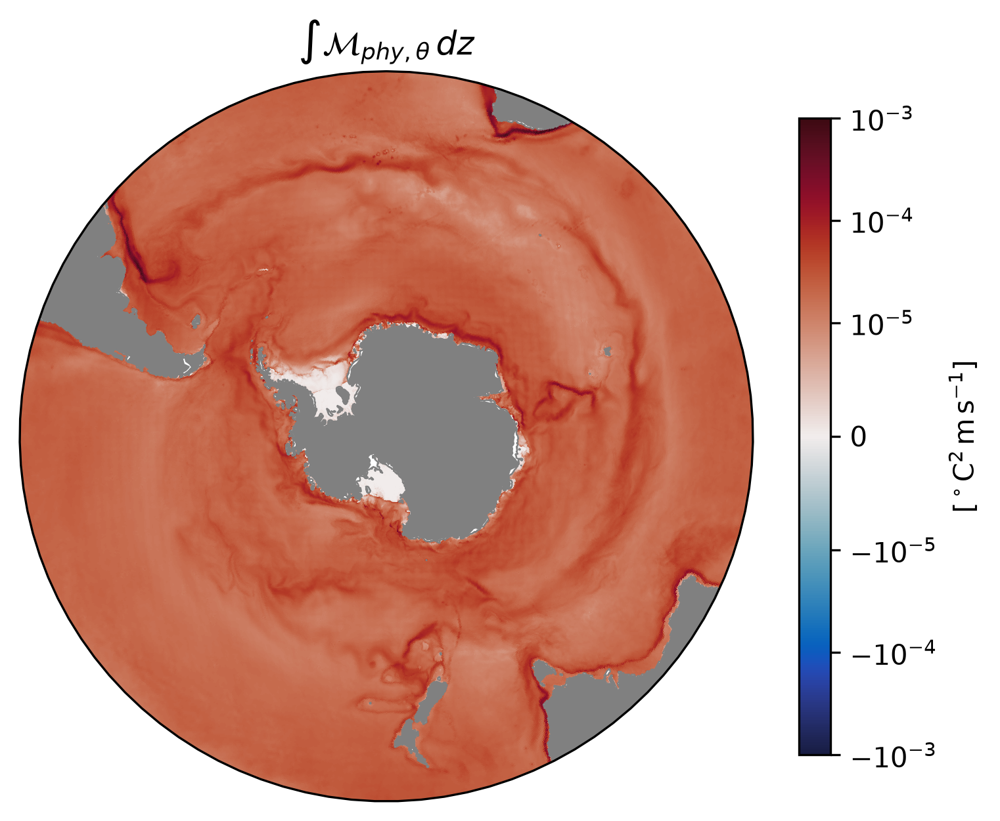

In [17]:
projection = ccrs.SouthPolarStereo()
transform = ccrs.PlateCarree()
descriptor = mosaic.Descriptor(dsm,projection,transform)

fig, ax = plt.subplots(
    figsize=(6,6),
    # constrained_layout=True,
    subplot_kw={"projection": projection},
    dpi=300
)

norm = colors.SymLogNorm(
    linthresh=1e-5,
    linscale=1,
    vmin=-1e-3,
    vmax=1e-3,
    base=10
)

c = mosaic.polypcolor(
    ax,
    descriptor,
    data[0],
    antialiaseds=False,
    edgecolors="none",
    cmap=cmocean.cm.balance,
    norm=norm
)

# # Colorbar
fig.colorbar(
    c,
    # ax=ax,
    shrink=0.7,
    label=r"[$^\circ\mathrm{C}^2\,\mathrm{m}\,\mathrm{s}^{-1}$]"
)

mosaic.coastlines(
    ax,
    descriptor,
    color="gray", 
    lw = 0.5
)

# ax.coastlines(
#     resolution="50m",
#     linewidth=0.5,
#     color="gray"
# )

ax.add_feature(
    cfeature.LAND,#.with_scale("10m"),
    facecolor="gray",
    edgecolor="none",
    zorder=-1,
    # alpha=0.8
)
# Focus on Southern Ocean
ax.set_extent(
    [-180, 180, -90, -30],
    crs=ccrs.PlateCarree()
)
# Make the polar map circular
theta = np.linspace(0, 2 * np.pi, 100)
center = [0.5, 0.5]
radius = 0.5

verts = np.vstack([
    np.sin(theta) * radius + center[0],
    np.cos(theta) * radius + center[1]
]).T

circle = mpath.Path(verts)

ax.set_boundary(circle, transform=ax.transAxes)
ax.set_title(
    r"$\int \mathcal{M}_{phy,\theta}\,dz$"
)

### Now remake the same plot with higher resolution cartopy coastlines and land. It technically isn't the model mesh, but it'll look better for talks / pubs

Text(0.5, 1.0, '$\\int \\mathcal{M}_{phy,\\theta}\\,dz$')

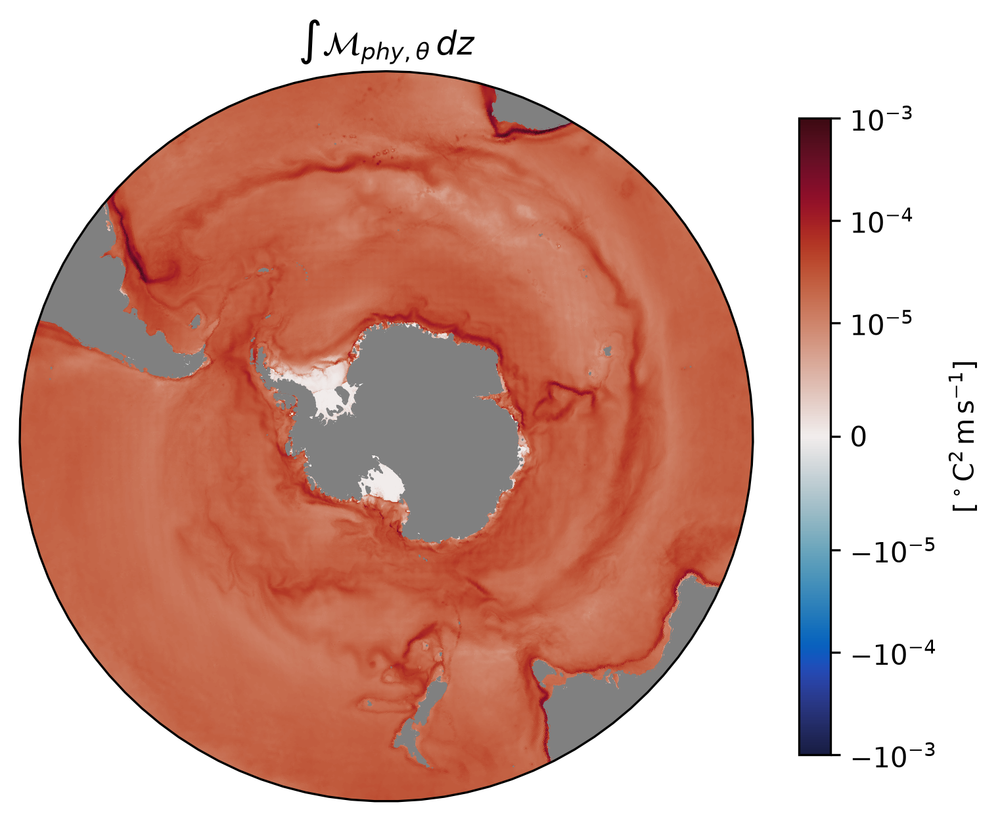

In [18]:
projection = ccrs.SouthPolarStereo()
transform = ccrs.PlateCarree()
descriptor = mosaic.Descriptor(dsm,projection,transform)

fig, ax = plt.subplots(
    figsize=(6,6),
    # constrained_layout=True,
    subplot_kw={"projection": projection},
    dpi=300
)

norm = colors.SymLogNorm(
    linthresh=1e-5,
    linscale=1,
    vmin=-1e-3,
    vmax=1e-3,
    base=10
)

c = mosaic.polypcolor(
    ax,
    descriptor,
    data[0],
    antialiaseds=False,
    edgecolors="none",
    cmap=cmocean.cm.balance,
    norm=norm
)

fig.colorbar(
    c,
    shrink=0.7,
    label=r"[$^\circ\mathrm{C}^2\,\mathrm{m}\,\mathrm{s}^{-1}$]"
)

ax.coastlines(
    resolution="10m",
    linewidth=0.5,
    color="gray"
)

ax.add_feature(
    cfeature.LAND.with_scale("10m"),
    facecolor="gray",
    edgecolor="none",
    zorder=-1,
    # alpha=0.8
)
# Focus on Southern Ocean
ax.set_extent(
    [-180, 180, -90, -30],
    crs=ccrs.PlateCarree()
)
# Make the polar map circular
theta = np.linspace(0, 2 * np.pi, 100)
center = [0.5, 0.5]
radius = 0.5

verts = np.vstack([
    np.sin(theta) * radius + center[0],
    np.cos(theta) * radius + center[1]
]).T

circle = mpath.Path(verts)

ax.set_boundary(circle, transform=ax.transAxes)
ax.set_title(
    r"$\int \mathcal{M}_{phy,\theta}\,dz$"
)

## Now make global plots -- first do robinson, then stereographic

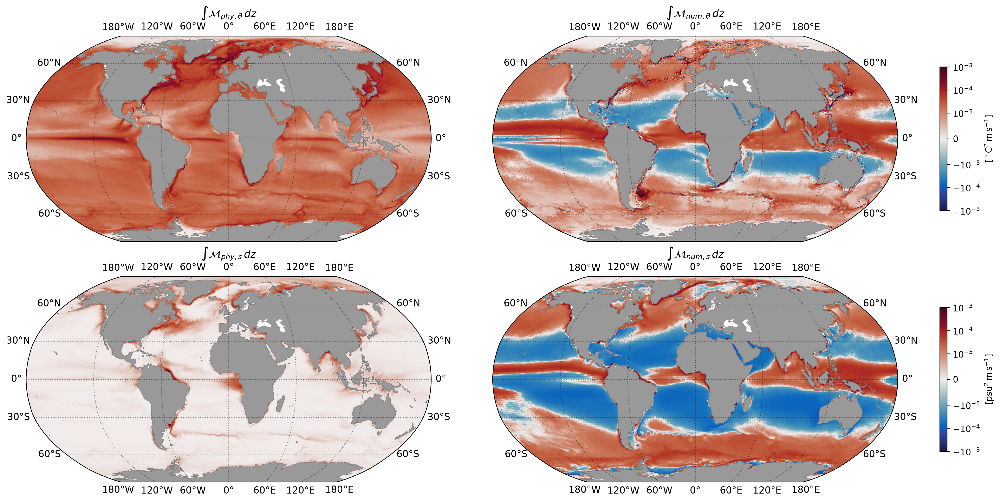

In [20]:
projection = ccrs.Robinson()
transform = ccrs.PlateCarree()
descriptor = mosaic.Descriptor(dsm, projection, transform)

fig, axs = plt.subplots(
    2, 2,
    figsize=(16, 8),
    constrained_layout=True,
    subplot_kw={"projection": projection},
    dpi=300
)

norm_temp = colors.SymLogNorm(
    linthresh=1e-5,
    linscale=1,
    vmin=-1e-3,
    vmax=1e-3,
    base=10
)

norm_salt = colors.SymLogNorm(
    linthresh=1e-5,
    linscale=1,
    vmin=-1e-3,
    vmax=1e-3,
    base=10
)

titles = [
    r"$\int \mathcal{M}_{phy,\theta}\,dz$",
    r"$\int \mathcal{M}_{num,\theta}\,dz$",
    r"$\int \mathcal{M}_{phy,s}\,dz$",
    r"$\int \mathcal{M}_{num,s}\,dz$"
]

norms = [
    norm_temp,
    norm_temp,
    norm_salt,
    norm_salt
]

cbar_labels = [
    r"[$^\circ\mathrm{C}^2\,\mathrm{m}\,\mathrm{s}^{-1}$]",
    r"[$^\circ\mathrm{C}^2\,\mathrm{m}\,\mathrm{s}^{-1}$]",
    r"[$\mathrm{psu}^2\,\mathrm{m}\,\mathrm{s}^{-1}$]",
    r"[$\mathrm{psu}^2\,\mathrm{m}\,\mathrm{s}^{-1}$]"
]

for i, (ax, field, title, norm, cbar_label) in enumerate(
    zip(axs.flat, data_all, titles, norms, cbar_labels)
):

    c = mosaic.polypcolor(
        ax,
        descriptor,
        field,
        antialiaseds=False,
        edgecolors="none",
        cmap=cmocean.cm.balance,
        norm=norm
    )

    if i % 2 == 1:
        fig.colorbar(
            c,
            ax=ax,
            shrink=0.7,
            label=cbar_label
        )

    mosaic.coastlines(
        ax,
        descriptor,
        lw=0.5,
        color="gray"
    )

    ax.add_feature(
        cfeature.LAND,
        fc="gray",
        zorder=-1,
        alpha=0.8
    )

    gl = ax.gridlines(
        linewidth=0.75,
        color="black",
        alpha=0.5,
        linestyle="dotted",
        draw_labels=True
    )

    gl.xlabel_style = {"size": 11}
    gl.ylabel_style = {"size": 11}

    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    # Only show longitude labels on bottom row
    if i < 2:
        gl.bottom_labels = False

    # # Only show latitude labels on left column
    if i % 2 == 1:
        gl.left_labels = False

    ax.set_title(
        title,
        # fontsize=14
    )

### Stereographic

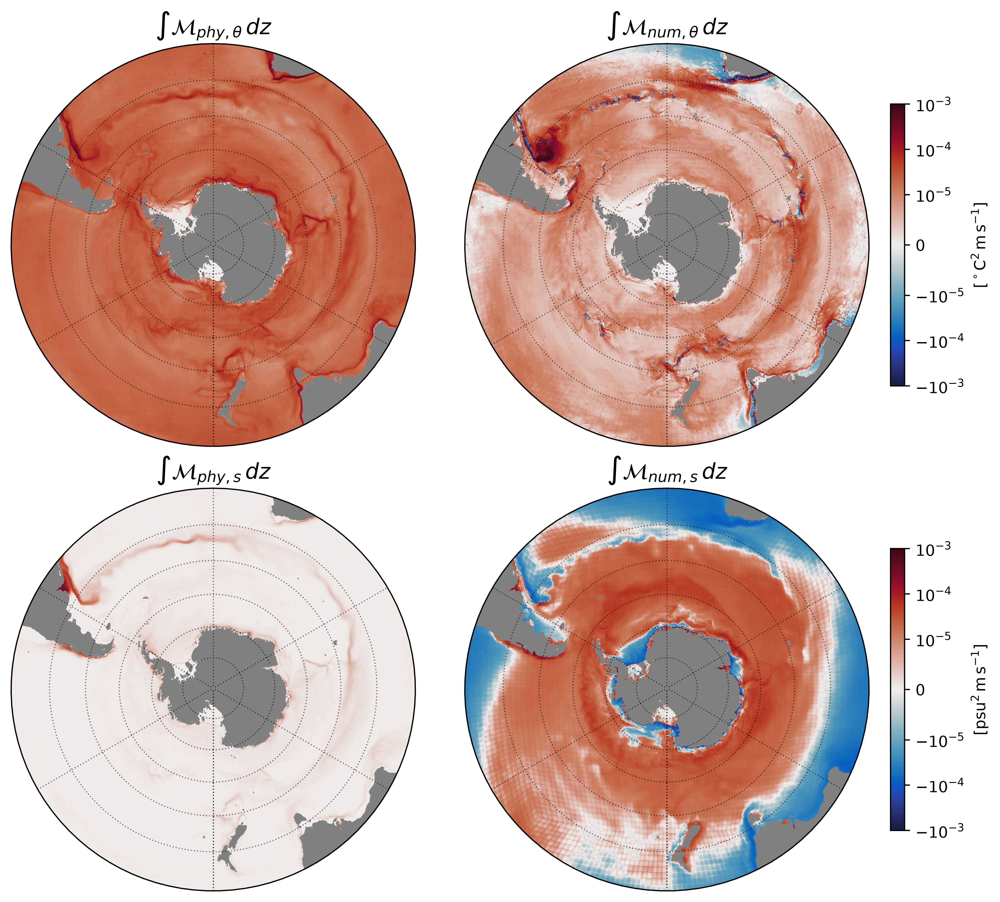

In [24]:
projection = ccrs.SouthPolarStereo()
transform = ccrs.PlateCarree()
descriptor = mosaic.Descriptor(dsm,projection,transform)

fig, axs = plt.subplots(
    2, 2,
    figsize=(9, 8),
    constrained_layout=True,
    subplot_kw={"projection": projection},
    dpi=500
)

norm_temp = colors.SymLogNorm(
    linthresh=1e-5,
    linscale=1,
    vmin=-1e-3,
    vmax=1e-3,
    base=10
)

norm_salt = colors.SymLogNorm(
    linthresh=1e-5,
    linscale=1,
    vmin=-1e-3,
    vmax=1e-3,
    base=10
)

titles = [
    r"$\int \mathcal{M}_{phy,\theta}\,dz$",
    r"$\int \mathcal{M}_{num,\theta}\,dz$",
    r"$\int \mathcal{M}_{phy,s}\,dz$",
    r"$\int \mathcal{M}_{num,s}\,dz$"
]

norms = [
    norm_temp,
    norm_temp,
    norm_salt,
    norm_salt
]

cbar_labels = [
    r"[$^\circ\mathrm{C}^2\,\mathrm{m}\,\mathrm{s}^{-1}$]",
    r"[$^\circ\mathrm{C}^2\,\mathrm{m}\,\mathrm{s}^{-1}$]",
    r"[$\mathrm{psu}^2\,\mathrm{m}\,\mathrm{s}^{-1}$]",
    r"[$\mathrm{psu}^2\,\mathrm{m}\,\mathrm{s}^{-1}$]"
]

theta = np.linspace(0, 2 * np.pi, 100)

center = [0.5, 0.5]
radius = 0.5

verts = np.vstack([
    np.sin(theta) * radius + center[0],
    np.cos(theta) * radius + center[1]
]).T

circle = mpath.Path(verts)


for i, (ax, field, title, norm, cbar_label) in enumerate(
    zip(axs.flat, data_all, titles, norms, cbar_labels)
):


    c = mosaic.polypcolor(
        ax,
        descriptor,
        field,
        antialiaseds=False,
        edgecolors="none",
        cmap=cmocean.cm.balance,
        norm=norm
    )

    if i % 2 == 1:
        fig.colorbar(
            c,
            ax=ax,
            shrink=0.7,
            label=cbar_label
        )

    ax.coastlines(
        resolution="50m",
        linewidth=0.5,
        color="gray"
    )

    ax.add_feature(
        cfeature.LAND.with_scale("50m"),
        facecolor="gray",
        edgecolor="none",
        zorder=-1
    )

    ax.set_extent(
        [-180, 180, -90, -30],
        crs=ccrs.PlateCarree()
    )
    
    ax.set_boundary(
        circle,
        transform=ax.transAxes
    )

    gl = ax.gridlines(
        linewidth=0.75,
        color="black",
        alpha=0.5,
        linestyle="dotted"
    )
    ax.set_title(
        title,
        fontsize=14
    )

plt.show()

### Look at some statistics

In [22]:
# Numerical / physical for temperature 
ratio = data[1] / data[0]

print("Integrated numerical / physical:")
print(data[1].sum().item() / data[0].sum().item())

print("\nMean pointwise ratio:")
print(ratio.mean().item())

print("\nMedian pointwise ratio:")
print(ratio.median().item())

print("\n10th percentile:")
print(ratio.quantile(0.10).item())

print("\n90th percentile:")
print(ratio.quantile(0.90).item())

print("\nFraction where numerical > physical:")
print((data[1] > data[0]).mean().item())

Integrated numerical / physical:
0.5509049097977419

Mean pointwise ratio:
45022260.0

Median pointwise ratio:
0.3373470902442932

10th percentile:
-0.6105592787265777

90th percentile:
1.5497856855392453

Fraction where numerical > physical:
0.13283310426804354


In [52]:
# Numerical / physical for salt
ratio = data1[1] / data1[0]

print("Integrated numerical / physical:")
print(data1[1].sum().item() / data1[0].sum().item())

print("\nMean pointwise ratio:")
print(ratio.mean().item())

print("\nMedian pointwise ratio:")
print(ratio.median().item())

print("\n10th percentile:")
print(ratio.quantile(0.10).item())

print("\n90th percentile:")
print(ratio.quantile(0.90).item())

print("\nFraction where numerical > physical:")
print((data[1] > data[0]).mean().item())

Integrated numerical / physical:
3.12198911289898

Mean pointwise ratio:
42987687936.0

Median pointwise ratio:
11.786660194396973

10th percentile:
-111.83930206298827

90th percentile:
76.1333641052246

Fraction where numerical > physical:
0.13283310426804354
